#**Importing the Required Libraries**

In [1]:
import os


In [2]:
import glob

In [3]:
from IPython.display import Image, display

# **In the First Step, We need to check whether we have access to the GPU or not**

In [5]:
!nvidia-smi

Thu Feb 16 15:21:36 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P0    25W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [6]:
HOME = os.getcwd()

In [7]:
print(HOME)

/content


#**Installing Ultralytics using Pip Install**

#**YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.**

In [8]:
# Git clone method (for development)

# %cd {HOME}
# !git clone github.com/ultralytics/ultralytics
# %cd {HOME}/ultralytics
# !pip install -qe ultralytics

# from IPython import display
# display.clear_output()

# import ultralytics
# ultralytics.checks()

In [9]:
#!pip install ultralytics==8.0.0

In [10]:
!git clone https://github.com/MuhammadMoin97/ultralytics.git

Cloning into 'ultralytics'...
remote: Enumerating objects: 3857, done.
remote: Counting objects: 100% (121/121), done.
remote: Compressing objects: 100% (101/101), done.
remote: Total 3857 (delta 37), reused 69 (delta 19), pack-reused 3736
Receiving objects: 100% (3857/3857), 1.86 MiB | 4.44 MiB/s, done.
Resolving deltas: 100% (2646/2646), done.


#**Setting the Current Directory**

In [11]:
%cd {HOME}/ultralytics

/content/ultralytics


#**Installing all the Dependencies**

In [12]:
!pip install -e '.[dev]'

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Obtaining file:///content/ultralytics
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.1/154.1 KB 15.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 184.0/184.0 KB 22.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.8/227.8 KB 25.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 73.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 105.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 KB 338.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 KB 11.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 KB 9.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 62.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.8/97.8 K

##Checking whether YOLOv8 is Installed and its working Fine

In [13]:
import ultralytics

In [14]:
ultralytics.checks()

Ultralytics YOLOv8.0.3 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 24.5/78.2 GB disk)


#**Importing the Traffic Lights Dataset from Roboflow**

In [26]:
HOME = '/content/ultralytics/ultralytics/yolo/v8/detect'

In [27]:
%cd {HOME}
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="iOqPD5zonb3Ou6XZ2Xpe")
project = rf.workspace("wawan-pradana").project("cinta_v2")
dataset = project.version(1).download("yolov5")

/content/ultralytics/ultralytics/yolo/v8/detect
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to cinTA_v2-1 in yolov5pytorch:: 100%|██████████| 4806/4806 [00:01<00:00, 4068.79it/s]


#**Train the YOLOv8 Model on the Custom Dataset**

In [28]:
%cd {HOME}

/content/ultralytics/ultralytics/yolo/v8/detect


In [29]:
%cd {dataset.location}

/content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1


In [30]:
%cd {HOME}

!python train.py model=yolov8l.pt data={dataset.location}/data.yaml epochs=80 imgsz=640

/content/ultralytics/ultralytics/yolo/v8/detect
yolo/engine/trainer: task=detect, mode=train, model=yolov8l.pt, data=/content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/data.yaml, epochs=80, patience=50, batch=16, imgsz=640, save=True, cache=False, device=None, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=False, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, retina_masks=False, format=torchscript, keras=False, optimize=False, int8=False, dynamic=False, simplify=False, opset=17, workspace=4, nms=False, lr0=0.

In [60]:
!ls {HOME}/runs/detect/train2

args.yaml					    train_batch2.jpg
confusion_matrix.png				    train_batch9240.jpg
events.out.tfevents.1676561334.18c875ed401b.3659.0  train_batch9241.jpg
F1_curve.png					    train_batch9242.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
predictions.json				    val_batch1_labels.jpg
R_curve.png					    val_batch1_pred.jpg
results.csv					    val_batch2_labels.jpg
results.png					    val_batch2_pred.jpg
train_batch0.jpg				    weights
train_batch1.jpg


#**Displaying the Confusion Matrix**

/content/ultralytics/ultralytics/yolo/v8/detect


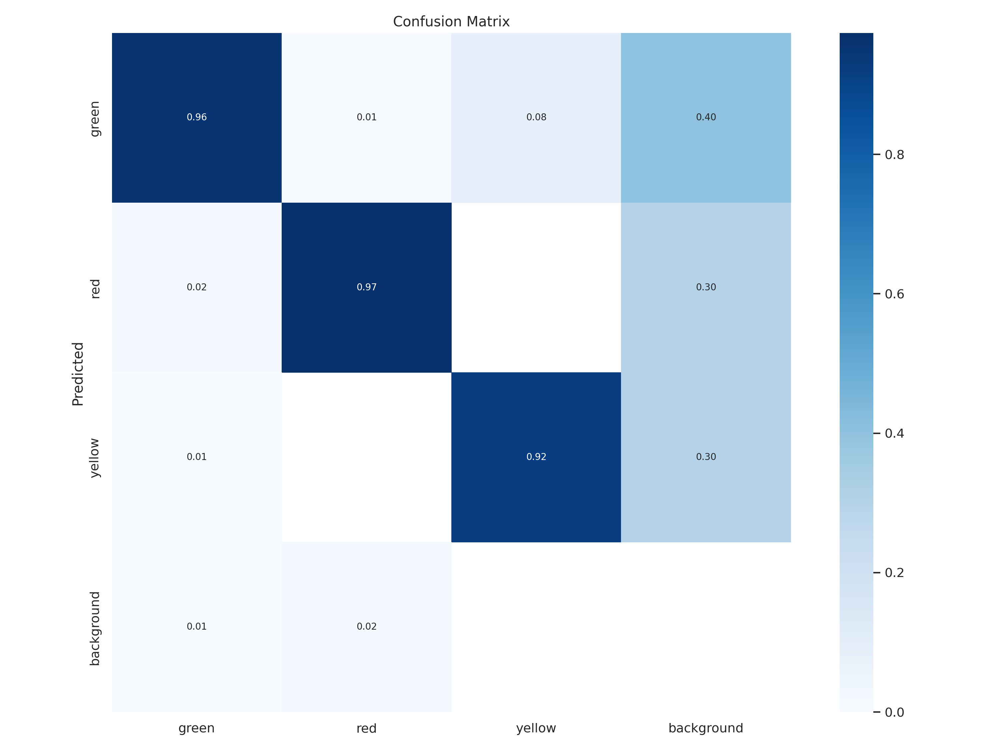

In [32]:
#Confusion matrix is the chart that shows how our model handles different classes
#96% of the time the model detected correctly that currently the green light is on, while 2% of the time we get the Bounding Box but
#the green light is incorrectly classified as red light, while 1% of the time we also get the bounding box but the green light 
#is incorrectly classified as yellow,  light while 1% of the time when the green light is on the model is unable to detect it
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/confusion_matrix.png', width=900)

#**Training and Validation Loss**

/content/ultralytics/ultralytics/yolo/v8/detect


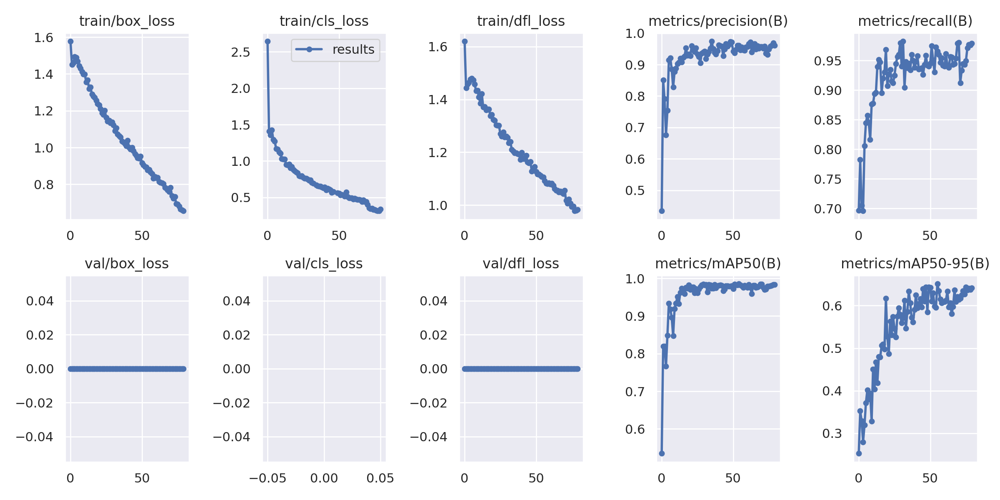

In [33]:
# Here is the graph of the training and validation loss
#box loss and class loss is important 
# The behavior of the model is convincing the model is coverging, Training more will give better results
%cd {HOME}

Image(filename=f'{HOME}/runs/detect/train2/results.png', width=600)

/content/ultralytics/ultralytics/yolo/v8/detect


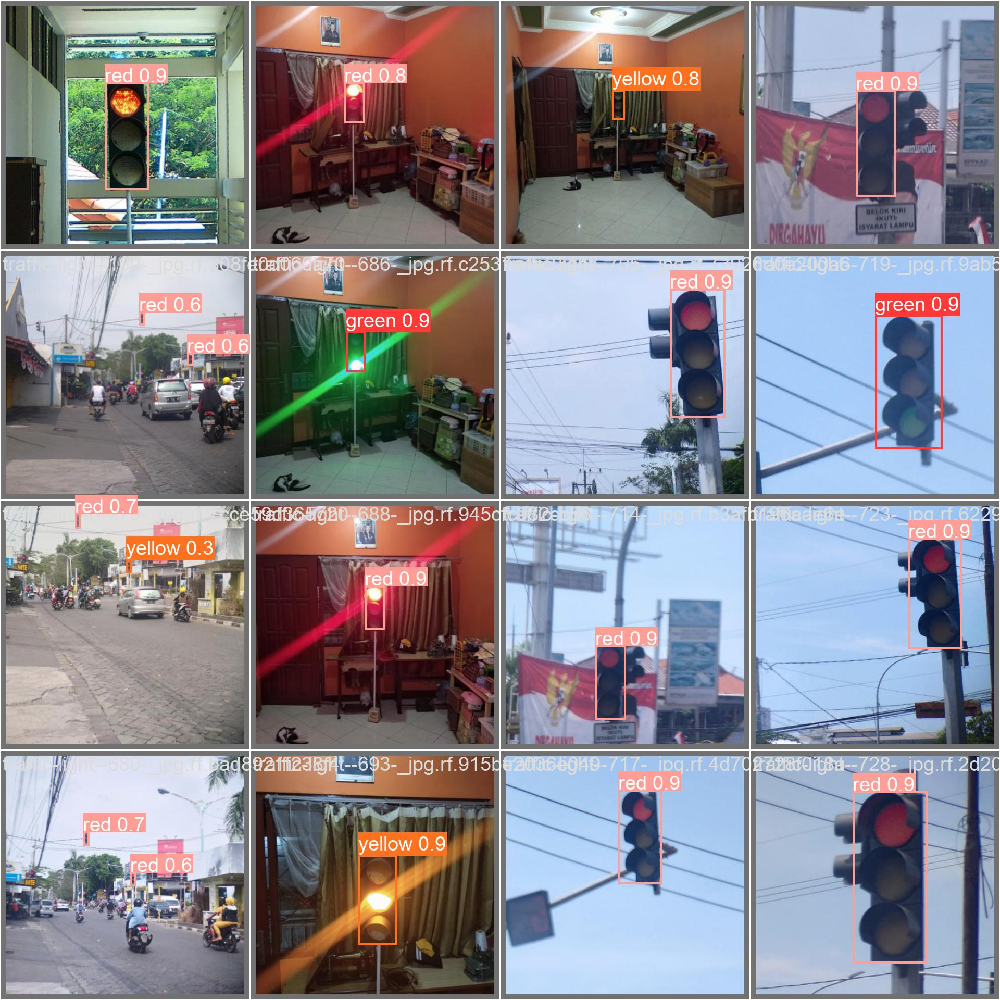

In [34]:
#Model Prediction on validation batch. These image are not used strictly for training so it is always better to take a 
#look and see how model is behaving
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/val_batch0_pred.jpg', width=600)

#**Validate Custom Model**

In [61]:
#Here, we are taking the model best weights and using them to validate the model

%cd {HOME}

!python val.py model='{HOME}/runs/detect/train2/weights/best.pt' data={dataset.location}/data.yaml

/content/ultralytics/ultralytics/yolo/v8/detect
Ultralytics YOLOv8.0.3 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Fusing layers... 
Model summary: 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
val: Scanning /content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/valid/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100% 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 13/13 [00:10<00:00,  1.23it/s]
                   all        200        272      0.947      0.965      0.983      0.653
                 green        200         92      0.957      0.967      0.976       0.63
                   red        200        155      0.961      0.974      0.988      0.631
                yellow        200         25      0.923      0.955      0.986      0.697
Speed: 1.8ms pre-process, 36.6ms inference, 0.0ms loss, 2.8ms post-process per image


#**Inference with Custom Model**

In [62]:
# Testing the Model on Test Dataset images
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train2/weights/best.pt' source='/content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images'

/content/ultralytics/ultralytics/yolo/v8/detect
Ultralytics YOLOv8.0.3 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Fusing layers... 
Model summary: 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
image 1/100 /content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images/traffic-light--119-_jpg.rf.65198e341a15fa6a0ba8be43a289c5f2.jpg: 640x640 1 yellow, 64.6ms
image 2/100 /content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images/traffic-light--122-_jpg.rf.63cb9e27085f500f6936833c196db2b8.jpg: 640x640 1 yellow, 61.9ms
image 3/100 /content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images/traffic-light--128-_jpg.rf.a6747dec0b2c37a87c352aaca5903f4b.jpg: 640x640 1 red, 34.8ms
image 4/100 /content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images/traffic-light--134-_jpg.rf.3d82c581d4357d7e702169962004d148.jpg: 640x640 1 green, 34.0ms
image 5/100 /content/ultralytics/ultralytics/yolo/v8/detect/cinTA_v2-1/test/images/tra

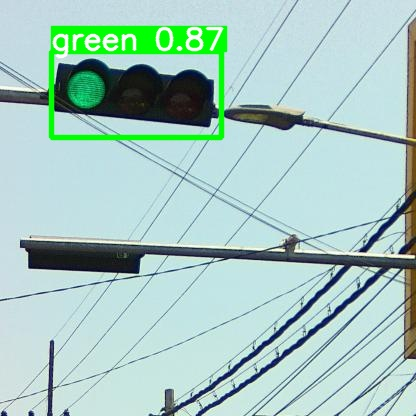

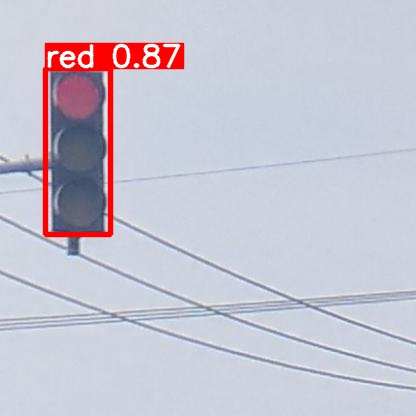

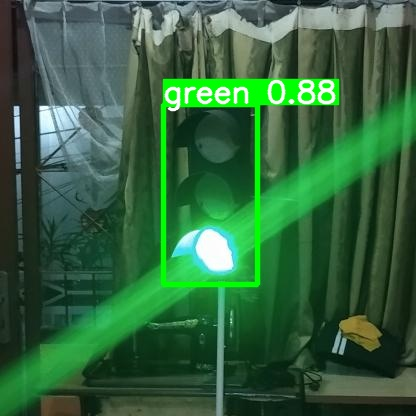

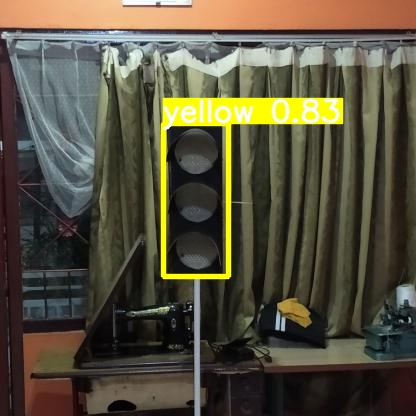

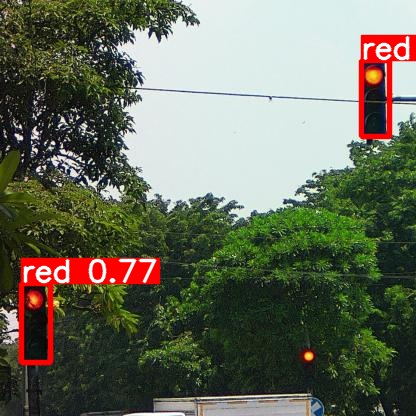

In [63]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train11/*.jpg')[:5]:
      display(Image(filename=image_path, width=600))
      print("\n")

#**Testing on a Demo Video**

In [64]:
!gdown "https://drive.google.com/uc?id=1rCRcTpoLWxGi26gDdpnI-Nv6t2Ybi8rA&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1rCRcTpoLWxGi26gDdpnI-Nv6t2Ybi8rA&confirm=t
To: /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4
100% 4.50M/4.50M [00:00<00:00, 282MB/s]


In [65]:
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train2/weights/best.pt' source='video1.mp4' conf=0.45

/content/ultralytics/ultralytics/yolo/v8/detect
Ultralytics YOLOv8.0.3 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Fusing layers... 
Model summary: 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
video 1/1 (1/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 40.8ms
video 1/1 (2/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 39.9ms
video 1/1 (3/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 39.9ms
video 1/1 (4/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 28.4ms
video 1/1 (5/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 28.5ms
video 1/1 (6/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 28.4ms
video 1/1 (7/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 28.5ms
video 1/1 (8/183) /content/ultralytics/ultralytics/yolo/v8/detect/video1.mp4: 384x640 22.0ms
video 1/1 (9/183) /content/ult

#**Display the Demo Video**

In [66]:
!rm "/content/result_compressed.mp4"

In [67]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train12/video1.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**Downloading the Demo Video2**

In [68]:
!gdown "https://drive.google.com/uc?id=1Bm2XklAu83XJiP6C3-6hAEu-tzbGUv6K&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Bm2XklAu83XJiP6C3-6hAEu-tzbGUv6K&confirm=t
To: /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4
100% 4.41M/4.41M [00:00<00:00, 266MB/s]


#**Testing on the Demo Video**

In [69]:
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train2/weights/best.pt' source='video2.mp4' 

/content/ultralytics/ultralytics/yolo/v8/detect
Ultralytics YOLOv8.0.3 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Fusing layers... 
Model summary: 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
video 1/1 (1/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 49.0ms
video 1/1 (2/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 35.7ms
video 1/1 (3/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 35.7ms
video 1/1 (4/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 35.7ms
video 1/1 (5/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 29.1ms
video 1/1 (6/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 28.9ms
video 1/1 (7/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.mp4: 640x384 1 red, 27.7ms
video 1/1 (8/220) /content/ultralytics/ultralytics/yolo/v8/detect/video2.m

#**Display the Demo Video**

In [70]:
!rm "/content/result_compressed.mp4"

In [71]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train13/video2.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)

#**Downloading the Demo Video3**

In [72]:
!gdown "https://drive.google.com/uc?id=1PuC8imuJk3Wx-LILQVAtGw8Fuy5Kz8yR&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1PuC8imuJk3Wx-LILQVAtGw8Fuy5Kz8yR&confirm=t
To: /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4
100% 47.6M/47.6M [00:00<00:00, 229MB/s]


#**Testing on the Demo Video**

In [73]:
%cd {HOME}

!python predict.py model='{HOME}/runs/detect/train2/weights/best.pt' source='video3.mp4' 

/content/ultralytics/ultralytics/yolo/v8/detect
Ultralytics YOLOv8.0.3 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15110MiB)
Fusing layers... 
Model summary: 268 layers, 43608921 parameters, 0 gradients, 164.8 GFLOPs
video 1/1 (1/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 41.7ms
video 1/1 (2/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 40.8ms
video 1/1 (3/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 40.8ms
video 1/1 (4/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 40.9ms
video 1/1 (5/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 40.8ms
video 1/1 (6/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 40.8ms
video 1/1 (7/412) /content/ultralytics/ultralytics/yolo/v8/detect/video3.mp4: 384x640 1 green, 40.8ms
video 1/1 (8/412) /content/ultralytics/ultralytics/yolo/v8/d

#**Display the Demo Video**

In [74]:
!rm "/content/result_compressed.mp4"

In [75]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/ultralytics/ultralytics/yolo/v8/detect/runs/detect/train14/video3.mp4'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
HTML("""
<video width=400 controls>
      <source src="%s" type="video/mp4">
</video>
""" % data_url)